# Рынок заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» хотят открыть заведение общественного питания в Москве. Необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.


## План проекта:
   1) Изучение предоставленных данных: предобработка и предварительный анализ
   
   2) Построение визуализации
   
   3) Изучение особенностей кофеен
   
   4) Подготовка презентации

##  Подключение библиотек, чтение файлов

In [1]:
#Подключение библиотек
import pandas as pd
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
import math as mth
import seaborn as sns
import scipy.stats as stats
import plotly.express as px
import folium
from folium import Marker, Map, Choropleth
from folium.plugins import MarkerCluster
from folium.features import GeoJsonTooltip

from plotly import graph_objects as go
sns.set_palette('pastel') 
pd.options.mode.chained_assignment = None

In [2]:
data=pd.read_csv('/datasets/moscow_places.csv')

## Предобработка данных

In [3]:
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


### Обработка пропусков

Есть пропуски в столбцах с расписанием (hours), категорией цены (price),  средней стоимостью заказа(avg_bill),  числом с оценкой среднего чека(middle_avg_bill), числом с оценкой одной чашки капучино(middle_coffee_cup) и количеством посадочных мест(seats).

Можно попробовать заполнить часть пропусков в категории цен самостоятельно, ориентируясь на средний чек и цену чашки кофе, однако мне кажется, что это будет напрасной тратой ресурсов, т.к пропусков в этих столбцах также хватает, и их заполнить полезной информацией уже не выйдет. Следовательно, кол-во заполненных пропусков в "price" если и сократится, то незначительно.

Исходя из этого, предлагаю оставить, как есть, строки с категорией цены, кол-вом посадочных мест,  средней стоимостью заказа,  числом с оценкой среднего чека и с оценкой одной чашки капучино; пропуски в расписании закрыть заглушкой "неизвестно".

In [5]:
data['hours']=data['hours'].fillna('Неизвестно')

### Обработка дубликатов

In [6]:
data.duplicated().sum()
#Полных дубликатов нет

0

In [7]:
data['name'].duplicated().sum()

2792

In [8]:
dup=data[data['name'].duplicated()]
dup

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
23,Буханка,булочная,"Москва, Лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,1,NaN
47,Кафе,кафе,"Москва, улица Маршала Федоренко, 7",Северный административный округ,"ежедневно, 11:00–00:00",55.880306,37.489760,2.8,NaN,NaN,NaN,NaN,0,35.0
71,CofeFest,кофейня,"Москва, Новгородская улица, 23А",Северо-Восточный административный округ,пн-пт 08:00–19:00,55.901799,37.577672,4.1,NaN,NaN,NaN,NaN,1,NaN
75,Хинкали-Gали!,кафе,"Москва, Дмитровское шоссе, 100",Северный административный округ,"ежедневно, 12:00–23:00",55.881626,37.545617,4.9,NaN,NaN,NaN,NaN,1,NaN
91,Шашлык,булочная,"Москва, Абрамцевская улица, 1",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.891932,37.573445,4.2,NaN,NaN,NaN,NaN,1,240.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8274,Ли,кафе,"Москва, Рязанский проспект, 30, корп. 2",Юго-Восточный административный округ,"ежедневно, 10:30–21:00",55.718076,37.783650,4.7,NaN,NaN,NaN,NaN,1,116.0
8317,Беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN
8340,Семейный Очаг,ресторан,"Москва, Шоссейная улица, 13",Юго-Восточный административный округ,"ежедневно, 12:00–00:00",55.688104,37.725197,4.3,средние,Средний счёт:до 1000 ₽,1000.0,NaN,1,98.0
8379,Лагман Хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0


In [9]:
#Подозрительно много. Может, тут сетевые заведения отображаются по несколько раз?
dup[dup['chain']==0]
#Интересно. Можно было бы предположить, что "Кафе" - это ещё и название сетевого заведения, 
#но периодически несовпадающие часы работы и категория говорят о том, что это всё-таки ошибка в данных. Удалим.

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
47,Кафе,кафе,"Москва, улица Маршала Федоренко, 7",Северный административный округ,"ежедневно, 11:00–00:00",55.880306,37.489760,2.8,NaN,NaN,NaN,NaN,0,35.0
108,Кафе,"бар,паб","Москва, МКАД, 82-й километр, вл18",Северо-Восточный административный округ,Неизвестно,55.908930,37.558777,4.2,NaN,NaN,NaN,NaN,0,NaN
123,Кафе,кафе,"Москва, Шенкурский проезд, 14",Северо-Восточный административный округ,Неизвестно,55.897794,37.591395,4.3,NaN,NaN,NaN,NaN,0,50.0
141,Кафе,кафе,"Москва, Дубнинская улица, 52, стр. 1",Северный административный округ,"ежедневно, 10:00–20:00",55.896020,37.556072,3.9,NaN,NaN,NaN,NaN,0,70.0
159,Кафе,кафе,"Москва, Дмитровское шоссе, 163А",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.908830,37.538790,4.0,NaN,NaN,NaN,NaN,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7931,Кафе,кафе,"Москва, Каширское шоссе, 67А",Южный административный округ,Неизвестно,55.596680,37.725980,4.0,NaN,NaN,NaN,NaN,0,NaN
7938,Кафе,кафе,"Москва, улица Генерала Белова, 28, корп. 1",Южный административный округ,Неизвестно,55.604990,37.724762,4.5,NaN,NaN,NaN,NaN,0,NaN
7945,Кафе,кафе,"Москва, МКАД, 19-й километр, вл20с1",Южный административный округ,Неизвестно,55.621773,37.781727,4.0,NaN,NaN,NaN,NaN,0,NaN
7976,Кафе,кафе,"Москва, МКАД, 19-й километр, вл12с1",Южный административный округ,Неизвестно,55.616980,37.779312,4.3,NaN,NaN,NaN,NaN,0,NaN


In [10]:
data = data.query('not(name.duplicated() and chain==0)')
data['name'].duplicated().sum()

2443

Дубликаты удалены. Оставшиеся 2443 - это сетевые заведения, их удалять не стоит. 

In [11]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Итак, всего есть 8 разных типов заведений. Дубликатов нет.

### Добавление столбцов

In [12]:
#Добавим два столбца: с названиями улиц и с указанием, является ли заведение круглосуточным 
data['street'] = data['address'].str.split(', ').apply(lambda x: x[1])
data['is_24/7']= data['hours'].str.contains('ежедневно, круглосуточно')
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица,True


In [13]:
#Если заведение работает круглосуточно, то столбец "hours" не будет содержать чисел, означающих время работы
#Чаще всего часы работы содержат "0" - т.к время стараются сделать "круглым".  Отберём все строчки, не содержащие "0"
data_always=data[data['hours'].str.contains('0')==False]
#Проверим, что осталось:
data_always['hours'].unique()

#Итак, под критерий "работает 24/7" подходят только заведения с записью "ежедневно, круглосуточно".

array(['ежедневно, круглосуточно', 'Неизвестно', 'вт-вс круглосуточно',
       'сб круглосуточно', 'пт-вс круглосуточно',
       'пн,ср,чт,пт,сб,вс круглосуточно', 'Нет информации',
       'пн,вт,ср,чт,сб,вс круглосуточно'], dtype=object)

### Сокращение названий округов
Название каждого округа занимает слишком много места. При дальнейшей визуализации это будет неудобно. Поменяем на общепринятые аббревиатуры

In [14]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [15]:
#Дублёр для хороплета
data_to_map=data.copy()

In [16]:
data['district']=data['district'].replace('Северный административный округ', 'САО')
data['district']=data['district'].replace('Северо-Восточный административный округ', 'СВАО')
data['district']=data['district'].replace('Северо-Западный административный округ', 'СЗАО')
data['district']=data['district'].replace('Южный административный округ', 'ЮАО')
data['district']=data['district'].replace('Юго-Западный административный округ', 'ЮЗАО')
data['district']=data['district'].replace('Юго-Восточный административный округ', 'ЮВАО')
data['district']=data['district'].replace('Восточный административный округ', 'ВАО')
data['district']=data['district'].replace('Западный административный округ', 'ЗАО')
data['district']=data['district'].replace('Центральный административный округ', 'ЦАО')
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",САО,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",САО,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",САО,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",САО,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",САО,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",ЮЗАО,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",ЮАО,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",ЮВАО,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",ЮВАО,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица,True


In [17]:
data_to_map

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица,True


### Вывод
В результате предобработки данных было сделано следующее:
 -  Выявлено очень много пропущенных данных. Есть пропуски в столбцах с расписанием (hours), категорией цены (price), средней стоимости заказа(avg_bill), числом с оценкой среднего чека(middle_avg_bill), (middle_coffee_cup) и количеством посадочных мест(seats), причём в случае с расписанием это всего лишь 6% данных, в случае с количеством посадочных мест-43%, а в остальных - больше 50%. Цена чашки кофе указана только в 535 строчках - 6% данных.  Т.к удалять большую часть данных было бы нерационально, пропуски в расписании я заменила на "неизвестно", остальные оставила, как есть.
 - Полных дубликатов не обнаружено. Однако есть дубликаты в названиях. Большая часть образовалась из-за сетевых заведений, однако имела место ошибка, в результате которой часть названий заменилась на тип заведения (348 "Кафе" и 1 "Ресторан") - эти строчки были удалены. Таким образом, исследуются 8057 заведений.
 - Названия округов заменены на их сокращения для удобства визуализации.
 - Добавлены два столбца: с названиями улиц и с указанием, является ли заведение круглосуточным .

## Анализ данных

### Исследование категорий заведений
Как было выявлено в предобработке, всего 8 типов заведений: 'кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'.

In [18]:
#Изучим распределение кол-ва заведений по типам. Будем учитывать сетевые магазины только один раз
types = data.pivot_table(index='category',values='address',aggfunc='count').reset_index()
types

,category,address
0,"бар,паб",761
1,булочная,253
2,быстрое питание,561
3,кафе,2175
4,кофейня,1399
5,пиццерия,630
6,ресторан,2001
7,столовая,277


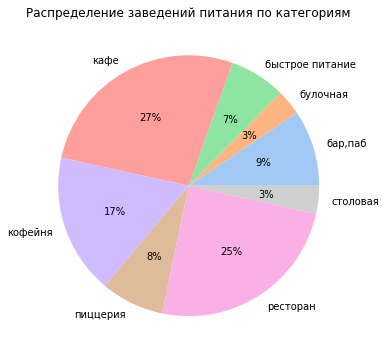

In [19]:
plt.figure(figsize=(6, 6))
plt.pie(types['address'], labels=types['category'], autopct='%1.0f%%')
plt.title('Распределение заведений питания по категориям')
plt.show()

Итак, больше всего кафе (27%) и ресторанов (25%). Кофейни на третьем месте (17%). Меньше всего столовых и булочных (по 3%).

### Исследование количества посадочных мест

In [20]:
# Изучим количество посадочных мест в местах по категориям
num_seats = data.pivot_table(index='category',values='seats',aggfunc='mean').reset_index().round()
num_seats['seats']=num_seats['seats'].astype('int')
num_seats=num_seats.sort_values(by='seats', ascending=False).reset_index(drop=True)
num_seats

,category,seats
0,"бар,паб",125
1,ресторан,122
2,кофейня,112
3,столовая,105
4,быстрое питание,101
5,кафе,99
6,пиццерия,95
7,булочная,88


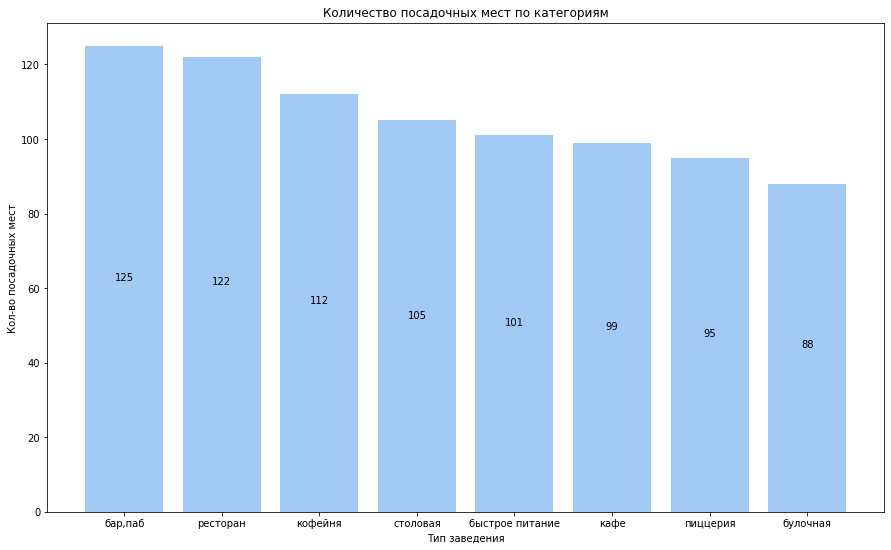

In [21]:
plt.figure(figsize=(15, 9))
plt.bar(x=num_seats['category'], height=num_seats['seats'])

#Фунцкия для добавления чисел на график в центре столбика
def addlabels_с(x,y):
    for i in range(len(x)):
        plt.text(i, y[i]//2, y[i], ha = 'center')
addlabels_с(num_seats['category'], num_seats['seats']) 

plt.title('Количество посадочных мест по категориям')
plt.xlabel('Тип заведения')
plt.ylabel('Кол-во посадочных мест')
plt.show()

Больше всего в среднем посадочных мест в барах (возможно, за счёт мест у стойки?) - 125. В ресторанах чуть меньше - 122. В кофейнях - 112. Минимальное  среднее число в булочных - 88. 

### Исследование количества сетевых заведений
Каждое сетевое заведение будем учитывать только один раз. Создадим таблицу без дубликатов в столбце 'name'.

In [22]:
data_by_name= data.query('not(name.duplicated())')
data_by_name['name'].duplicated().sum()

0

In [23]:
all_by_chain = data_by_name.pivot_table(index='category',values='address',aggfunc='count').reset_index()
all_by_chain=all_by_chain.sort_values(by='address', ascending=False).reset_index(drop=True)
all_by_chain

,category,address
0,кафе,1628
1,ресторан,1444
2,кофейня,796
3,"бар,паб",653
4,быстрое питание,405
5,пиццерия,349
6,столовая,223
7,булочная,116


In [24]:
is_chain= data_by_name.pivot_table(index='category',values='chain',aggfunc='sum').reset_index()
is_chain=is_chain.sort_values(by='chain', ascending=False).reset_index(drop=True)


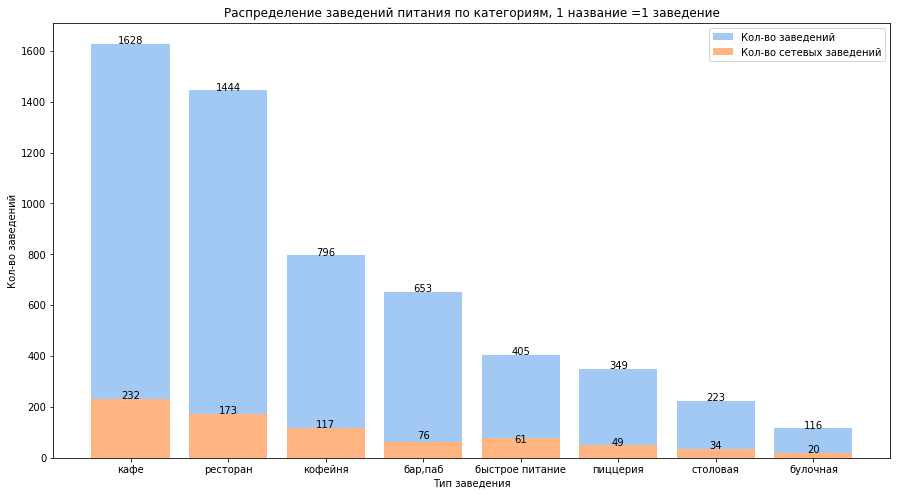

In [25]:
plt.figure(figsize=(15, 8))
plt.bar(x=all_by_chain['category'], height=all_by_chain['address'], label = 'Кол-во заведений')
plt.bar(x=is_chain['category'], height=is_chain['chain'], label = 'Кол-во сетевых заведений')

#Фунцкия для добавления чисел на график наверх столбика
def addlabels_t(x,y):
    for i in range(len(x)):
        plt.text(i, y[i], y[i], ha = 'center')
addlabels_t(all_by_chain['category'], all_by_chain['address'])
addlabels_t(is_chain['category'], is_chain['chain'])

plt.title('Распределение заведений питания по категориям, 1 название =1 заведение')
plt.xlabel('Тип заведения')
plt.legend()
plt.ylabel('Кол-во заведений')

plt.show()

In [26]:
#Посмотрим суммарное соотношение сетевых заведений к не-сетевым
count_chain=data_by_name.groupby('chain')['category'].count().reset_index()
count_chain

,chain,category
0,0,4852
1,1,762


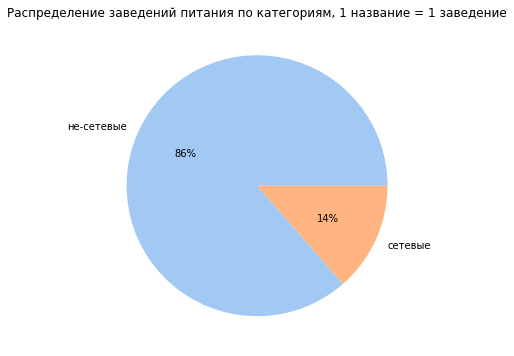

In [27]:
plt.figure(figsize=(6, 6))
plt.pie(count_chain['category'], labels=['не-сетевые', 'сетевые'], autopct='%1.0f%%')
plt.title('Распределение заведений питания по категориям, 1 название = 1 заведение')
plt.show()

In [28]:
### Для сравнения построим те же графики, считая каждый ресторан сети отдельным заведением
all_by_chain_2 = data.pivot_table(index='category',values='address',aggfunc='count').reset_index()
all_by_chain_2=all_by_chain_2.sort_values(by='address', ascending=False).reset_index(drop=True)
all_by_chain_2

,category,address
0,кафе,2175
1,ресторан,2001
2,кофейня,1399
3,"бар,паб",761
4,пиццерия,630
5,быстрое питание,561
6,столовая,277
7,булочная,253


In [29]:
is_chain_2= data.pivot_table(index='category',values='chain',aggfunc='sum').reset_index()
is_chain_2=is_chain_2.sort_values(by='chain', ascending=False).reset_index(drop=True)
is_chain_2

,category,chain
0,кафе,779
1,ресторан,730
2,кофейня,720
3,пиццерия,330
4,быстрое питание,232
5,"бар,паб",169
6,булочная,157
7,столовая,88


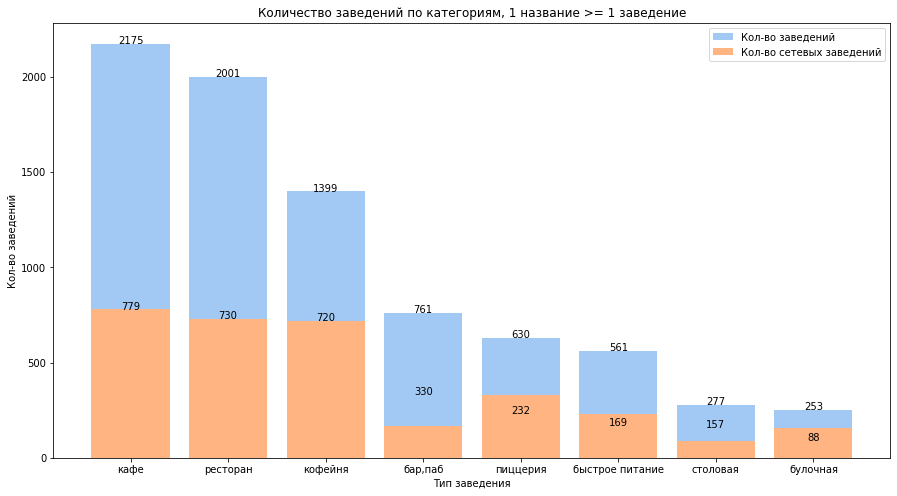

In [30]:
plt.figure(figsize=(15, 8))
plt.bar(x=all_by_chain_2['category'], height=all_by_chain_2['address'], label = 'Кол-во заведений')
plt.bar(x=is_chain_2['category'], height=is_chain_2['chain'], label = 'Кол-во сетевых заведений')

addlabels_t(all_by_chain_2['category'], all_by_chain_2['address'])
addlabels_t(is_chain_2['category'], is_chain_2['chain'])

plt.title('Количество заведений по категориям, 1 название >= 1 заведение')
plt.xlabel('Тип заведения')
plt.legend()
plt.ylabel('Кол-во заведений')

plt.show()

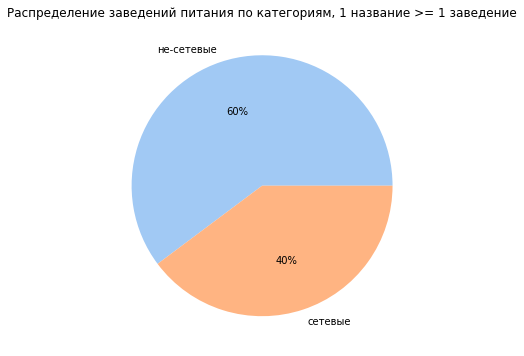

In [31]:
count_chain_2=data.groupby('chain')['category'].count().reset_index()
plt.figure(figsize=(6, 6))
plt.pie(count_chain_2['category'], labels=['не-сетевые', 'сетевые'], autopct='%1.0f%%')
plt.title('Распределение заведений питания по категориям, 1 название >= 1 заведение')
plt.show()

In [32]:
add_and_chain = all_by_chain_2.merge(is_chain_2, on='category', how='outer')
add_and_chain['percent']=round(add_and_chain['chain']*100/add_and_chain['address'],1)
add_and_chain.sort_values(by='percent')

,category,address,chain,percent
3,"бар,паб",761,169,22.2
6,столовая,277,88,31.8
0,кафе,2175,779,35.8
1,ресторан,2001,730,36.5
5,быстрое питание,561,232,41.4
2,кофейня,1399,720,51.5
4,пиццерия,630,330,52.4
7,булочная,253,157,62.1


Итак, не-сетевых заведений больше, чем сетевых (86% против 14%, если считать сеть заведений за одно, и 60% против 40% - если считать каждое заведение отдельно).

Чаще всего сетевыми бывают булочные:62.1% принажлежат той или иной сети. Далее пиццерии (52.4%) и кофейни (51.5%). Реже всего сетевыми бывают бары (22.2%)

### Топ-15 заведений
В данных есть два параметра, по которым можно оценить популярность заведения: рейтинг  и количество открытых точек. На мой взгляд, второй показательнее: если бизнес может расширяться, следовательно, он приносит достаточно прибыли - а следовательно, он должен быть популярным. Рейтинг был бы интересен, если бы мы знали количество оценок - а так мы можем решить, что самым  популярным является ресторан с рейтингои 5.0, в то время как это единственная оценка оценка от единственного посетителя. 

In [33]:
#Сгруппируем сетевые заведения по названиям и посмотрим, сколько точек у них есть
num_of_add=data.query('chain==1').groupby('name')['address'].count().reset_index()
top_15=num_of_add.sort_values(by='address', ascending=False).head(15).reset_index(drop='true')
top_15

,name,address
0,Шоколадница,120
1,Домино'с Пицца,76
2,Додо Пицца,74
3,One Price Coffee,71
4,Яндекс Лавка,69
5,Cofix,65
6,Prime,50
7,Хинкальная,44
8,КОФЕПОРТ,42
9,Кулинарная лавка братьев Караваевых,39


In [34]:
top_15_list=top_15['name'].unique()
top_15_list

array(['Шоколадница', "Домино'с Пицца", 'Додо Пицца', 'One Price Coffee',
       'Яндекс Лавка', 'Cofix', 'Prime', 'Хинкальная', 'КОФЕПОРТ',
       'Кулинарная лавка братьев Караваевых', 'Теремок', 'Чайхана',
       'CofeFest', 'Буханка', 'Му-Му'], dtype=object)

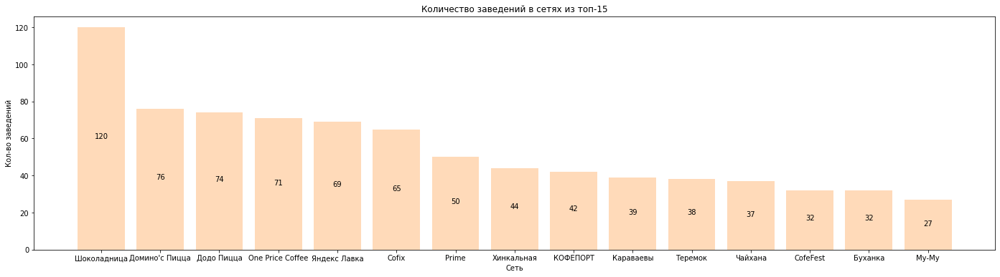

In [35]:
#Визуализация  для топ-15
top_15_rename=top_15
top_15_rename['name']=top_15['name'].replace('Кулинарная лавка братьев Караваевых', 'Караваевы')

plt.figure(figsize=(24, 6))
plt.bar(x=top_15_rename['name'], height=top_15_rename['address'], color='peachpuff')

addlabels_с(top_15_rename['name'], top_15['address'])

plt.title('Количество заведений в сетях из топ-15')
plt.xlabel('Сеть')

plt.ylabel('Кол-во заведений')

plt.show()

In [36]:
data_top_15=data.query('name in @top_15_list')
data_top_15.head(20)                       

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
13,Буханка,булочная,"Москва, Базовская улица, 15, корп. 1",САО,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0,Базовская улица,False
23,Буханка,булочная,"Москва, Лобненская улица, 13к2",САО,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,1,NaN,Лобненская улица,False
32,Додо Пицца,пиццерия,"Москва, Коровинское шоссе, 23, корп. 1",САО,"ежедневно, 09:00–23:00",55.877388,37.523334,4.3,NaN,Средний счёт:328 ₽,328.0,NaN,1,46.0,Коровинское шоссе,False
34,Домино'с Пицца,пиццерия,"Москва, Клязьминская улица, 11, корп. 4",САО,"ежедневно, 10:00–23:00",55.886963,37.523518,4.2,NaN,Средний счёт:от 500 ₽,500.0,NaN,1,247.0,Клязьминская улица,False
46,CofeFest,кофейня,"Москва, улица Маршала Федоренко, 6с1",САО,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица Маршала Федоренко,False
52,Cofix,кофейня,"Москва, улица Дыбенко, 7/1",САО,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко,False
71,CofeFest,кофейня,"Москва, Новгородская улица, 23А",СВАО,пн-пт 08:00–19:00,55.901799,37.577672,4.1,NaN,NaN,NaN,NaN,1,NaN,Новгородская улица,False
80,Му-Му,кафе,"Москва, улица Пришвина, 22",СВАО,"пн-пт 10:00–21:00; сб,вс 10:00–22:00",55.885986,37.602098,4.3,средние,Средний счёт:450 ₽,450.0,NaN,1,90.0,улица Пришвина,False
94,Домино'с Пицца,пиццерия,"Москва, Абрамцевская улица, 30, стр. 6",СВАО,"пн-пт 11:00–22:00; сб,вс 10:00–22:00",55.905994,37.576284,4.2,средние,NaN,NaN,NaN,1,16.0,Абрамцевская улица,False
95,Додо Пицца,пиццерия,"Москва, Дубнинская улица, 50",САО,"ежедневно, 09:00–23:00",55.893672,37.558562,4.3,NaN,Средний счёт:349 ₽,349.0,NaN,1,50.0,Дубнинская улица,False


Можно видеть, что в топ-15 попали в основном относительно недорогие сетевые заведения.

In [37]:
#Посмотрим распределение по районам
area_of_15=data_top_15.groupby(['district','name'])['address'].count().reset_index()
area_of_15

,district,name,address
0,ВАО,CofeFest,4
1,ВАО,Cofix,6
2,ВАО,One Price Coffee,6
3,ВАО,Prime,1
4,ВАО,Буханка,2
...,...,...,...
121,ЮЗАО,Теремок,3
122,ЮЗАО,Хинкальная,6
123,ЮЗАО,Чайхана,4
124,ЮЗАО,Шоколадница,7


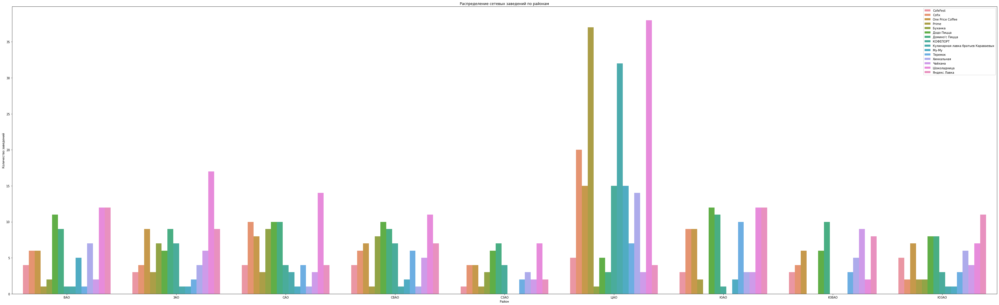

In [38]:
plt.figure(figsize=(60, 18))
sns.barplot(x='district', y='address', data=area_of_15, hue='name')
plt.title('Распределение сетевых заведений по районам')
plt.legend()
plt.xlabel('Район')
plt.ylabel('Количество заведений')
plt.show()

Очень интересно, но ничего не видно.  Построим хитмэп.

In [39]:
area_of_15=area_of_15.pivot("name", "district", values='address').fillna(0)
area_of_15

district,ВАО,ЗАО,САО,СВАО,СЗАО,ЦАО,ЮАО,ЮВАО,ЮЗАО
name,,,,,,,,,
CofeFest,4.0,3.0,4.0,4.0,1.0,5.0,3.0,3.0,5.0
Cofix,6.0,4.0,10.0,6.0,4.0,20.0,9.0,4.0,2.0
One Price Coffee,6.0,9.0,8.0,7.0,4.0,15.0,9.0,6.0,7.0
Prime,1.0,3.0,3.0,1.0,1.0,37.0,2.0,0.0,2.0
Буханка,2.0,7.0,9.0,8.0,3.0,1.0,0.0,0.0,2.0
Додо Пицца,11.0,6.0,10.0,10.0,6.0,5.0,12.0,6.0,8.0
Домино'с Пицца,9.0,9.0,10.0,9.0,7.0,3.0,11.0,10.0,8.0
КОФЕПОРТ,1.0,7.0,4.0,7.0,4.0,15.0,1.0,0.0,3.0
Кулинарная лавка братьев Караваевых,1.0,1.0,3.0,1.0,0.0,32.0,0.0,0.0,1.0


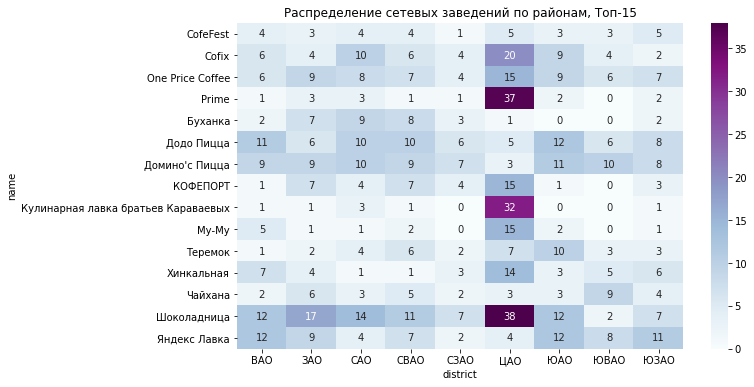

In [40]:
plt.figure(figsize=(10, 6))
sns.heatmap(area_of_15, cmap='BuPu', annot = True)
plt.title('Распределение сетевых заведений по районам, Топ-15')
plt.show()

Вывод: Больше всего заведений из топ-15 находится в ЦАО. По количеству лидируют Шоколадница (38 точек), Prime (37 точек) и братья Караваевы (32 точки).  Если смотреть распределение  по остальным районам, то чаще всего встречается та же Шоколадница. Prime и братья Караваевы же в других районах почти не представлены.  Зато много точек у Яндекс-Лавки,  Додо-Пицце и Домино'с пицце.

### Распределение типов заведений по районам

In [41]:
area_and_cat=data.groupby(['district','category'])['address'].count().reset_index()
area_and_cat

,district,category,address
0,ВАО,"бар,паб",52
1,ВАО,булочная,25
2,ВАО,быстрое питание,66
3,ВАО,кафе,236
4,ВАО,кофейня,105
...,...,...,...
67,ЮЗАО,кафе,224
68,ЮЗАО,кофейня,95
69,ЮЗАО,пиццерия,63
70,ЮЗАО,ресторан,165


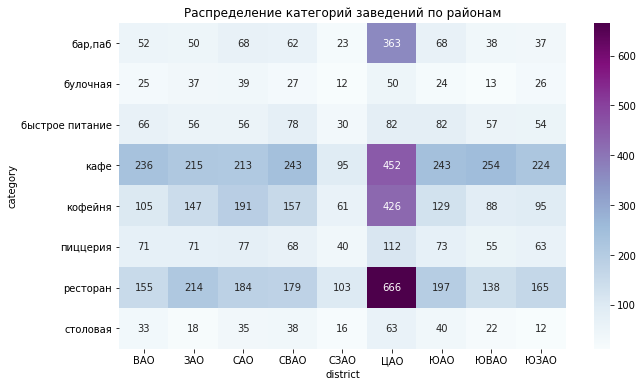

In [42]:
plt.figure(figsize=(10, 6))
sns.heatmap(area_and_cat.pivot("category", "district", values='address').fillna(0),cmap='BuPu', annot = True,fmt='.3g')
plt.title('Распределение категорий заведений по районам')
plt.show()
#Какое интересное число ресторанов в ЦАО...))

Вывод:  Во всех областях больше всего кафе и ресторанов, чуть меньше кофеен. Больше всего заведений каждого типа в центре, что ожидаемо.

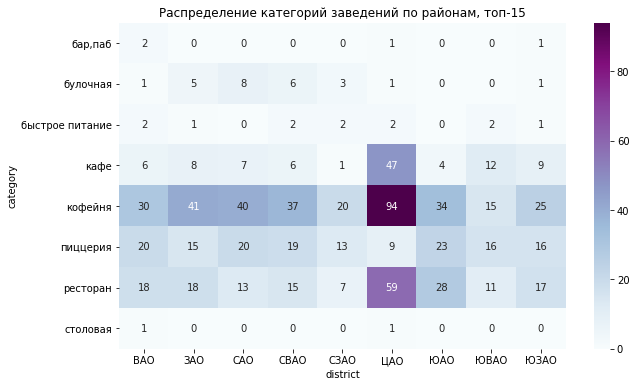

In [43]:
#Сделаем то же самое для заведений из топ-15
area_and_cat_15=data_top_15.groupby(['district','category'])['address'].count().reset_index()

plt.figure(figsize=(10, 6))
sns.heatmap(area_and_cat_15.pivot("category", "district", values='address').fillna(0),cmap='BuPu', annot = True,fmt='.3g')
plt.title('Распределение категорий заведений по районам, топ-15')
plt.show()

Вывод: Лидируют кофейни, меньше ресторанов и кафе. Больше всего в центре, как обычно. Однако в данных явно есть ошибки: не может в топе-15 оказаться бар с 4 точками (когда минимальное количество точек у "Му-му" - 27) и столовая -с двумя.

In [44]:
area_and_cat_15=data_top_15.groupby(['name','category'])['address'].count().reset_index()
area_and_cat_15

,name,category,address
0,CofeFest,кафе,1
1,CofeFest,кофейня,31
2,Cofix,кофейня,65
3,One Price Coffee,кофейня,71
4,Prime,кафе,1
5,Prime,ресторан,49
6,Буханка,булочная,25
7,Буханка,кафе,1
8,Буханка,кофейня,6
9,Додо Пицца,пиццерия,74


Ошибки определённо есть, но исправлять их сейчас не будем: я не рискну сказать, является ли, например, Хинкальная кафе или рестораном. Можно было бы исправить единичные выбросы,  которые вероятнее всего нужно отнести к большинству - но с учётом того, что мы исправить не сможем, это не сильно повлияет на данные.  

### Распределение рейтинга

In [45]:
rat_cat=data.groupby(['category'])['rating'].mean().reset_index()
rat_cat['rating']=rat_cat['rating'].round(1)
rat_cat

,category,rating
0,"бар,паб",4.4
1,булочная,4.3
2,быстрое питание,4.1
3,кафе,4.1
4,кофейня,4.3
5,пиццерия,4.3
6,ресторан,4.3
7,столовая,4.2


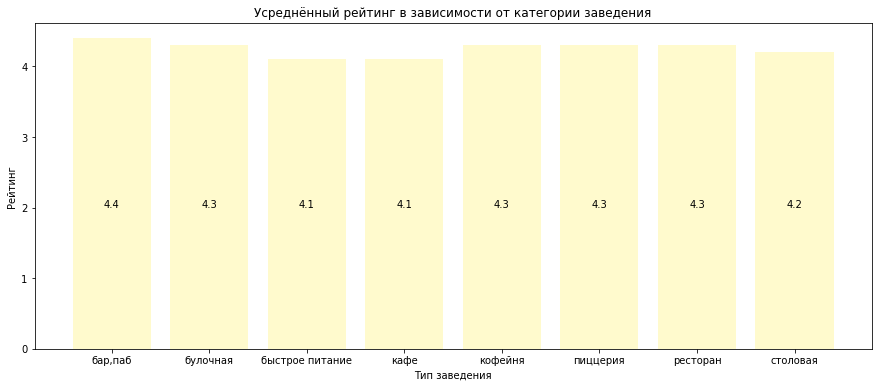

In [46]:
plt.figure(figsize=(15, 6))
plt.bar(x=rat_cat['category'], height=rat_cat['rating'], color='lemonchiffon')

addlabels_с(rat_cat['category'], rat_cat['rating'])

plt.title('Усреднённый рейтинг в зависимости от категории заведения')
plt.xlabel('Тип заведения')

plt.ylabel('Рейтинг')

plt.show()

Можно видеть, что усреднённые рейтинги почти не отличаются друг от друга и равны приблизительно 4.3

### Расположение

In [47]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# выводим карту
m

In [48]:
#Таблица с усреднённым рейтингом заведений по районам
rat_dist=data_to_map.groupby(['district'])['rating'].mean().reset_index()
rat_dist['rating']=rat_dist['rating'].round(1)
rat_dist

,district,rating
0,Восточный административный округ,4.2
1,Западный административный округ,4.2
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.2
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.1
7,Юго-Западный административный округ,4.2
8,Южный административный округ,4.2


In [49]:
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rat_dist,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Можно видеть, что выше всего рейтинг у заведений в центре - хотя из таблицы и легенды заметно, что различия в рейтинге несущественные.

In [50]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_to_map.apply(create_clusters, axis=1)

# выводим карту
m

In [51]:
#Посмотрим распределение количества заведений по улицам:
num_in_street=data.groupby(['street'])['address'].count().reset_index()
num_in_street=num_in_street.sort_values(by=['address'], ascending=False).reset_index(drop=True)
num_in_street

,street,address
0,проспект Мира,181
1,Профсоюзная улица,114
2,Ленинский проспект,106
3,проспект Вернадского,105
4,Ленинградский проспект,94
...,...,...
1408,Отрадный проезд,1
1409,Павелецкая набережная,1
1410,Панкратьевский переулок,1
1411,Парусный проезд,1


In [52]:
#Топ-15 улиц:
top_15_str=num_in_street.head(15)
top_15_str_list=top_15_str['street'].unique()
top_15_str_list

array(['проспект Мира', 'Профсоюзная улица', 'Ленинский проспект',
       'проспект Вернадского', 'Ленинградский проспект',
       'Дмитровское шоссе', 'Каширское шоссе', 'Варшавское шоссе',
       'Ленинградское шоссе', 'улица Вавилова', 'Люблинская улица',
       'Кутузовский проспект', 'МКАД', 'Пятницкая улица',
       'улица Миклухо-Маклая'], dtype=object)

In [53]:
data_top_15_street=data.query('street in @top_15_str_list').reset_index()
data_top_15_street

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",САО,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе,False
1,12,Заправка,кафе,"Москва, МКАД, 80-й километр, 1",САО,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,NaN,0,NaN,МКАД,False
2,17,Чайхана Беш-Бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",САО,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,Ленинградское шоссе,True
3,26,Пикочино,пиццерия,"Москва, Дмитровское шоссе, 107к2",САО,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00...",55.879390,37.541228,4.5,средние,Средний счёт:300–1500 ₽,900.0,NaN,0,NaN,Дмитровское шоссе,False
4,28,Mafe,кафе,"Москва, МКАД, 78-й километр, 14к1",САО,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,NaN,0,NaN,МКАД,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1209,8356,Назис Пури,кофейня,"Москва, Люблинская улица, 61",ЮВАО,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,0,NaN,Люблинская улица,False
1210,8396,Пекинский Двор,ресторан,"Москва, Ленинский проспект, 158",ЗАО,"ежедневно, 11:00–23:00",55.651706,37.482667,4.3,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,0,200.0,Ленинский проспект,False
1211,8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",ЮЗАО,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
1212,8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",ЮВАО,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True


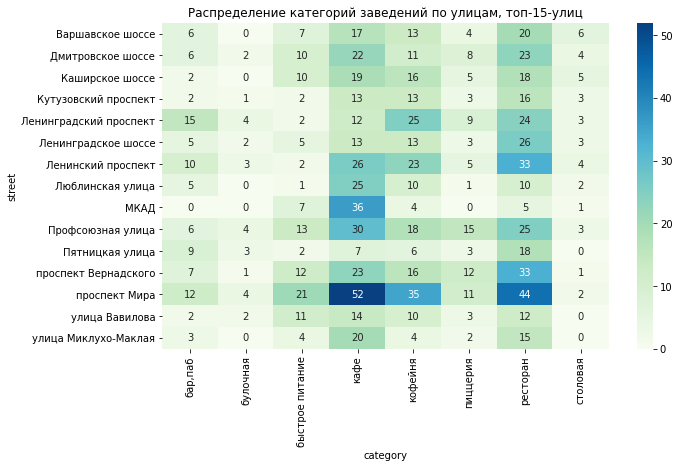

In [54]:
str_and_cat=data_top_15_street.groupby(['street','category'])['address'].count().reset_index()

plt.figure(figsize=(10, 6))
sns.heatmap(str_and_cat.pivot("street", "category", values='address').fillna(0),cmap='GnBu', annot = True,fmt='.3g')
plt.title('Распределение категорий заведений по улицам, топ-15-улиц')
plt.show()

Больше всего кафе и ресторанов, почти нет булочных и столовых. "Популярнее" всего Профсоюзная, проспект Мира и проспект Вернадского, меньше всего - на Кутузовском и на улице Миклухо-Маклая.

In [55]:
#Найдём улицы, на которых есть только одно заведение
str_of_1=num_in_street.query('address==1')
str_of_1_list=str_of_1['street'].unique()
data_just_1_street=data.query('street in @str_of_1_list').reset_index()
data_just_1_street

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",САО,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
1,21,7/12,кафе,"Москва, Прибрежный проезд, 7",САО,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
2,25,В парке вкуснее,кофейня,"Москва, парк Левобережный",САО,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
3,58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",СВАО,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False
4,60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",СВАО,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
451,8289,Мираж,ресторан,"Москва, улица Шкулёва, 2А",ЮВАО,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,0,90.0,улица Шкулёва,False
452,8294,WTFcoffee,кофейня,"Москва, улица Артюхиной, 14/8с1",ЮВАО,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,0,NaN,улица Артюхиной,False
453,8317,Беседка,кафе,"Москва, Кузьминская улица, 10",ЮВАО,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,Кузьминская улица,False
454,8379,Лагман Хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",ЮВАО,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0,Новороссийская улица,False


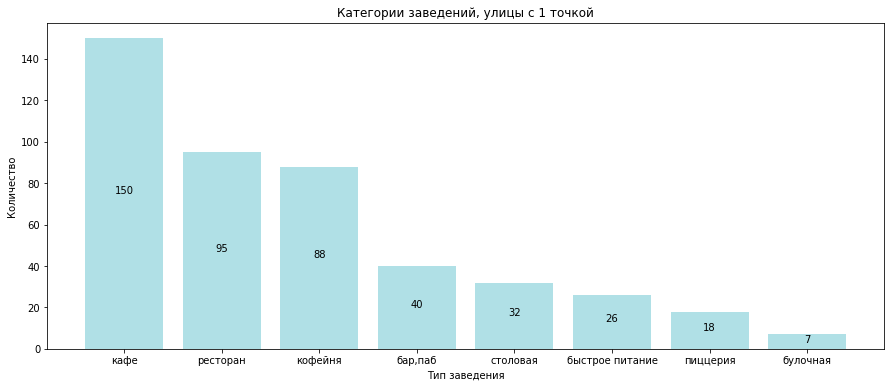

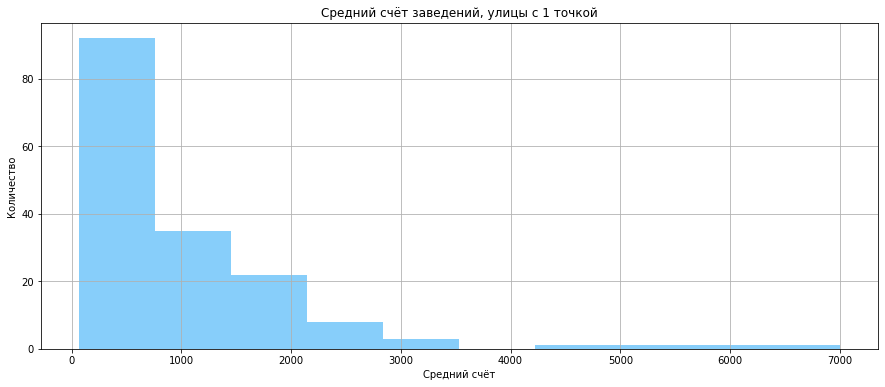

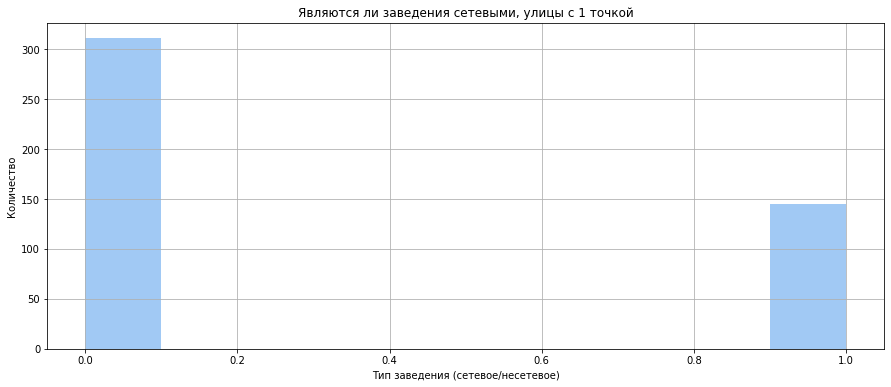

In [56]:
num_in_cat=data_just_1_street.groupby(['category'])['address'].count().reset_index()
num_in_cat=num_in_cat.sort_values(by=['address'], ascending=False).reset_index(drop=True)

plt.figure(figsize=(15, 6))
plt.bar(x=num_in_cat['category'], height=num_in_cat['address'], color='powderblue')
addlabels_с(num_in_cat['category'], num_in_cat['address'])
plt.xlabel('Тип заведения')
plt.ylabel('Количество')
plt.title('Категории заведений, улицы с 1 точкой')

plt.show()

plt.figure(figsize=(15, 6))
plt.title('Средний счёт заведений, улицы с 1 точкой')
data_just_1_street['middle_avg_bill'].hist(color='lightskyblue')
plt.xlabel('Средний счёт')
plt.ylabel('Количество')
plt.show()

plt.figure(figsize=(15, 6))
plt.title('Являются ли заведения сетевыми, улицы с 1 точкой')
data_just_1_street['chain'].hist()
plt.xlabel('Тип заведения (сетевое/несетевое)')
plt.ylabel('Количество')
plt.show()

Итак, большую часть таких "одиночных" заведений составляют кафе, чуть меньше кафе и кофеен. В большей части из них средний счёт меньше 1000, 2/3 из них несетевые.
Предположу, что сами улицы при этом недлинные.

### Средний чек

In [57]:
median_bill=data_to_map.groupby(['district'])['middle_avg_bill'].median().reset_index()
median_bill=median_bill.sort_values(by=['middle_avg_bill'], ascending=False).reset_index(drop=True)
median_bill

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,650.0
5,Восточный административный округ,600.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [58]:
#Чтобы не наслаивать хороплёты друг на друга, сделаем новую карту
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m1)

# выводим карту
m1


Можно видеть, что самый высокий средний чек в ЦАО и ЗАО, ниже всего - в ЮВАО

In [59]:
#Изучим цены в отдельных округах
#Cоздадим цикл, который выводит описание среднего чека для каждого из округов
arr_d=data['district'].unique()
for i in arr_d:
    df=data.query('district==@i')
    print('Средний чек в ', i)
    display(df['middle_avg_bill'].describe())

Средний чек в  САО


count      318.000000
mean       936.251572
std        915.294305
min        130.000000
25%        350.000000
50%        650.000000
75%       1250.000000
max      11000.000000
Name: middle_avg_bill, dtype: float64

Средний чек в  СВАО


count     300.000000
mean      718.166667
std       591.602850
min        50.000000
25%       325.000000
50%       500.000000
75%       956.250000
max      4500.000000
Name: middle_avg_bill, dtype: float64

Средний чек в  СЗАО


count     155.000000
mean      830.283871
std       594.539599
min       140.000000
25%       341.500000
50%       700.000000
75%      1100.000000
max      2900.000000
Name: middle_avg_bill, dtype: float64

Средний чек в  ЗАО


count     301.000000
mean     1056.269103
std       780.292499
min        50.000000
25%       435.000000
50%      1000.000000
75%      1500.000000
max      5250.000000
Name: middle_avg_bill, dtype: float64

Средний чек в  ЦАО


count    1059.000000
mean     1191.969783
std       919.969645
min         0.000000
25%       500.000000
50%      1000.000000
75%      1500.000000
max      7250.000000
Name: middle_avg_bill, dtype: float64

Средний чек в  ВАО


count      252.000000
mean       828.523810
std        857.705655
min         50.000000
25%        347.250000
50%        600.000000
75%       1100.000000
max      10000.000000
Name: middle_avg_bill, dtype: float64

Средний чек в  ЮВАО


count     192.000000
mean      658.932292
std       567.737155
min        30.000000
25%       300.000000
50%       450.000000
75%       906.250000
max      3750.000000
Name: middle_avg_bill, dtype: float64

Средний чек в  ЮАО


count     307.000000
mean      730.475570
std       544.067754
min       100.000000
25%       350.000000
50%       500.000000
75%      1025.000000
max      3500.000000
Name: middle_avg_bill, dtype: float64

Средний чек в  ЮЗАО


count     230.000000
mean      796.813043
std       554.779916
min       100.000000
25%       373.500000
50%       650.000000
75%      1100.000000
max      2750.000000
Name: middle_avg_bill, dtype: float64

Можно видеть, что выше всего значение среднего чека в ЦАО и ЗАО (хотя минимум для ЦАО - 0 рублей. Вероятно, это ошибка). Ниже всего в ЮВАО.

Линейной зависимости от расстояния до центра нет

### Вывод
- Исследование распределения по типам заведения: больше всего кафе (27%) и ресторанов (25%). Кофейни на третьем месте (17%). Меньше всего столовых и булочных (по 3%)


- Исследование числа посадочных мест: Больше всего в среднем посадочных мест в барах (возможно, за счёт мест у стойки?) - 125. В ресторанах чуть меньше - 122. В кофейнях - 112. Минимальное  среднее число в булочных - 88. 


- Исследование количества сетевых заведений: не-сетевых заведений больше, чем сетевых (86% против 14%, если считать сеть заведений за одно, и 60% против 40% - если считать каждое заведение отдельно). Чаще всего сетевыми бывают булочные:62.1% принажлежат той или иной сети. Далее пиццерии (52.4%) и кофейни (51.5%). Реже всего сетевыми бывают бары (22.2%)


- Исследование топ-15 сетей (оценка проводилась по количеству точек): 
  1. в топ-15 попали в основном относительно недорогие сетевые заведения
  2. Больше всего заведений из топ-15 находится в ЦАО. По количеству лидируют Шоколадница (38 точек), Prime (37 точек) и братья Караваевы (32 точки). Если смотреть распределение по остальным районам, то чаще всего встречается та же Шоколадница. Prime и братья Караваевы же в других районах почти не представлены. Зато много точек у Яндекс-Лавки, Додо-Пицце и Домино'с пицце.
  3. Лидируют кофейни, меньше ресторанов и кафе. Больше всего в центре, как обычно. 
 
 !! В данных явно есть ошибки: не может в топе-15 оказаться бар с 4 точками (когда минимальное количество точек у "Му-му" - 27) и столовая -с двумя. Принято решение не исправлять ошибки вручную из-за недостатка информации о типах заведений.
  
  
- Исследование распределения по районам: Во всех областях больше всего кафе и ресторанов, чуть меньше кофеен. Больше всего заведений каждого типа в центре


- Исследование рейтингов: 
    1. усреднённые рейтинги почти не отличаются друг от друга и равны приблизительно 4.3
    2. Выше всего рейтинг у заведений в центре - хотя различия в рейтинге несущественные, около 0.3 пунктов
    
    
- Исследование топ-15 улиц по кол-ву заведений: Больше всего кафе и ресторанов, почти нет булочных и столовых. "Популярнее" всего Профсоюзная, проспект Мира и проспект Вернадского, меньше всего - на Кутузовском и на улице Миклухо-Маклая.


- Исследование улиц с 1 заведением: большую часть таких "одиночных" заведений составляют кафе, чуть меньше кафе и кофеен. В большей части из них средний счёт меньше 1000, 2/3 из них несетевые. Предположу, что сами улицы при этом недлинные.

- Исследование среднего чека: 
  * Выше всего значение среднего чека в ЦАО и ЗАО (хотя минимум для ЦАО - 0 рублей. Вероятно, это ошибка). Медианное значение -1000 рублей.
  * Ниже всего в ЮВАО. Медианное значение  - 450 рублей.
  * Линейной зависимости от расстояния до центра нет.

## Открытие кофейни
1) Из предыдущего анализа данных можно сказать, что в городе 1399 кофеен, они составляют 17% от всех заведений. 720 из них сетевых - всего 117 сетей.

2) Больше всего их в центре (94 точки), меньше всего в ЮВАО (15 точек) и в СЗАО (20 точек). В  ЮЗАО 25 точек, в остальных от 30 до 41.

In [60]:
data_coffee=data.query('category=="кофейня"').reset_index(drop=True)
data_coffee_to_map=data_to_map.query('category=="кофейня"').reset_index(drop=True)
data_coffee

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",САО,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
1,В парке вкуснее,кофейня,"Москва, парк Левобережный",САО,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
2,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",САО,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,Коровинское шоссе,False
3,CofeFest,кофейня,"Москва, улица Маршала Федоренко, 6с1",САО,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица Маршала Федоренко,False
4,Cofix,кофейня,"Москва, улица Дыбенко, 7/1",САО,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1394,Назис Пури,кофейня,"Москва, Люблинская улица, 61",ЮВАО,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,0,NaN,Люблинская улица,False
1395,Квадрат кофе,кофейня,"Москва, Волгоградский проспект, 73, стр. 1",ЮВАО,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,Цена чашки капучино:100–220 ₽,NaN,160.0,0,206.0,Волгоградский проспект,False
1396,Шоколад имбирь корица,кофейня,"Москва, Грайвороновская улица, 23",ЮВАО,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,0,NaN,Грайвороновская улица,False
1397,Cafio,кофейня,"Москва, Новохохловская улица, 49",ЮВАО,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,Цена чашки капучино:80–120 ₽,NaN,100.0,0,NaN,Новохохловская улица,False


### Есть ли работающие круглосуточно кафе?

In [61]:
data_coffee[data_coffee['is_24/7']].reset_index(drop=True)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,Wild Bean,кофейня,"Москва, Дмитровское шоссе, 107Е",САО,"ежедневно, круглосуточно",55.878477,37.543426,3.5,NaN,NaN,NaN,NaN,1,20.0,Дмитровское шоссе,True
1,Wild Bean Cafe,кофейня,"Москва, Ярославское шоссе, 116",СВАО,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,NaN,NaN,1,25.0,Ярославское шоссе,True
2,Wild Bean Cafe,кофейня,"Москва, Ярославское шоссе, вл3с3",СВАО,"ежедневно, круглосуточно",55.851778,37.676423,4.5,NaN,Цена чашки капучино:140–200 ₽,NaN,170.0,1,NaN,Ярославское шоссе,True
3,Wild Bean Cafe,кофейня,"Москва, МКАД, 65-й километр, 8",СЗАО,"ежедневно, круглосуточно",55.813787,37.390701,4.3,NaN,NaN,NaN,NaN,1,NaN,МКАД,True
4,Шоколадница,кофейня,"Москва, улица Народного Ополчения, 49, корп. 1",СЗАО,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750.0,NaN,1,200.0,улица Народного Ополчения,True
5,Кофе Хауз,кофейня,"Москва, Ленинградский проспект, 74",САО,"ежедневно, круглосуточно",55.805239,37.516246,4.0,NaN,Цена чашки капучино:235–335 ₽,NaN,285.0,1,NaN,Ленинградский проспект,True
6,Кофемания,кофейня,"Москва, Ленинградский проспект, 37А, корп. 14,...",САО,"ежедневно, круглосуточно",55.790899,37.542776,4.7,NaN,NaN,NaN,NaN,1,15.0,Ленинградский проспект,True
7,You&coffee,кофейня,"Москва, улица Золоторожский Вал, 11, стр. 21",САО,"ежедневно, круглосуточно",55.803924,37.582251,4.2,NaN,NaN,NaN,NaN,1,NaN,улица Золоторожский Вал,True
8,Кофемания,кофейня,"Москва, Лесная улица, 5",ЦАО,"ежедневно, круглосуточно",55.777804,37.586346,4.4,высокие,Средний счёт:2000 ₽,2000.0,NaN,1,140.0,Лесная улица,True
9,Cinnabon,кофейня,"Москва, Долгоруковская улица, 40",ЦАО,"ежедневно, круглосуточно",55.778271,37.601991,4.2,NaN,NaN,NaN,NaN,1,230.0,Долгоруковская улица,True


Итак, в датасете есть 59 кофеен, работающих круглосуточно.

### Рейтинги и распределение по районам

In [62]:
rat_dist_с=data_coffee_to_map.groupby(['district'])['rating'].mean().reset_index()
rat_dist_с['rating']=rat_dist_с['rating'].round(1)
rat_dist_с

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.2
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.2


In [63]:
#То же самое для визуализации - с сокращёнными названиями районов
rat_dist_с_ao=data_coffee.groupby(['district'])['rating'].mean().reset_index()
rat_dist_с_ao['rating']=rat_dist_с['rating'].round(1)

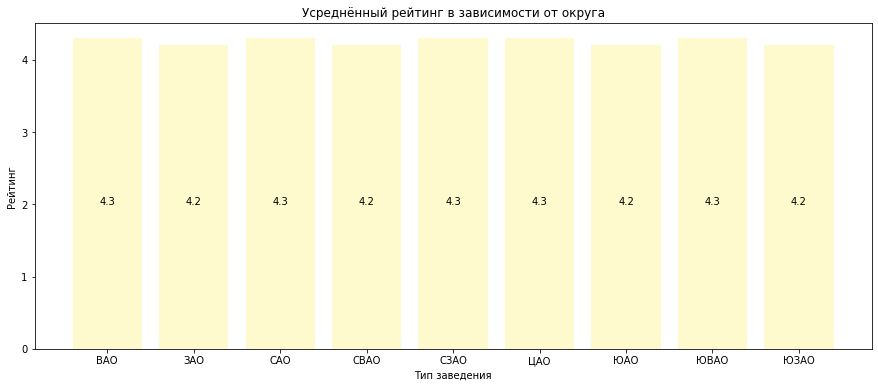

In [64]:
plt.figure(figsize=(15, 6))
plt.bar(x=rat_dist_с_ao['district'], height=rat_dist_с_ao['rating'], color='lemonchiffon')

addlabels_с(rat_dist_с_ao['district'], rat_dist_с_ao['rating'])

plt.title('Усреднённый рейтинг в зависимости от округа')
plt.xlabel('Тип заведения')

plt.ylabel('Рейтинг')

plt.show()

Можно видеть, что усреднённые рейтинги по районам почти не изменяются: от 4.2 до 4.3

### Особенности распределения по районам

In [65]:
#Распределение кофеен по районам
m_c = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=rat_dist_с,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Pastel1',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m_c)

# выводим карту
m_c

In [66]:
# создаём пустой кластер, добавляем его на карту
marker_cluster_c = MarkerCluster().add_to(m_c)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters_c(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster_c)

# применяем функцию create_clusters() к каждой строке датафрейма
data_coffee_to_map.apply(create_clusters_c, axis=1)

# выводим карту
m_c

- В Центре кофейни расположены относительно равномерно. 
- В Северном округе кофейни также расположены относительно равномерно, но в Дегунино и Западном Дегунино их почти нет
- В Южном округе количество кофеен убывает при удалении от центра. Хотя в Южном Орехово-Борисово и Центральном Чертаново их несколько больше, чем  близлежащих районах
- В Восточном округе кофейни по большей части расположены вокруг Измайловского лесопарка.
- В Западном округе количество кофеен больше ближе к центру, а также вдоль Кутузовского проспекта и в Раменках
- В Северо-западном округе также количество кофеен больше ближе к центру, а также в Тушино, Щукино и Хорошёво-Мневники
- В Северо-восточном округе кофейни расположены относительно равномерно, но ближе к окраинам Москвы их число сильно падает.
- В Юго-западном округе кофейни расположены относительно равномерно, но почти нет вокруг Битцевского парка
- В Юго-восточном округе больше всего кофеен в Марьино и Текстильщиках, почти нет в Кузьминках

In [67]:
median_bill_c=data_coffee_to_map.groupby(['district'])['middle_avg_bill'].median().reset_index()
median_bill_c=median_bill_c.sort_values(by=['middle_avg_bill'], ascending=False).reset_index(drop=True)
median_bill_c

,district,middle_avg_bill
0,Западный административный округ,600.0
1,Центральный административный округ,500.0
2,Восточный административный округ,400.0
3,Южный административный округ,387.5
4,Юго-Западный административный округ,375.0
5,Северный административный округ,325.0
6,Северо-Восточный административный округ,325.0
7,Северо-Западный административный округ,325.0
8,Юго-Восточный административный округ,250.0


In [68]:
num_of_point_c=data_coffee_to_map.groupby(['district'])['address'].count().reset_index()
num_of_point_c=num_of_point_c.sort_values(by=['address'], ascending=False).reset_index(drop=True)
num_of_point_c

,district,address
0,Центральный административный округ,426
1,Северный административный округ,191
2,Северо-Восточный административный округ,157
3,Западный административный округ,147
4,Южный административный округ,129
5,Восточный административный округ,105
6,Юго-Западный административный округ,95
7,Юго-Восточный административный округ,88
8,Северо-Западный административный округ,61


In [69]:
#Создадим новую карту для определения наилучшего округа для открытия
m_cof = Map(location=[moscow_lat, moscow_lng], zoom_start=10,overlay=False)

Choropleth(
    geo_data=state_geo,
    data=num_of_point_c,
    columns=['district', 'address'],
    key_on='feature.name',
    fill_color='Purples',
    fill_opacity=0.8,
    legend_name='Количество заведений по районам',
).add_to(m_cof)
m_cof

In [70]:
#Добавим на карту хороплет, демонстрирующий распределение среднего чека по округам
Choropleth(
    geo_data=state_geo,
    data=median_bill_c,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m_cof)

folium.LayerControl(collapsed=False).add_to(m_cof)
# выводим карту
m_cof

В ВАО и ЗАО средний чек достаточно большой, и при этом число заведений там не слишком велико => можно считать эти округа оптимальными для открытия новой точки.

### Цена чашки капучино

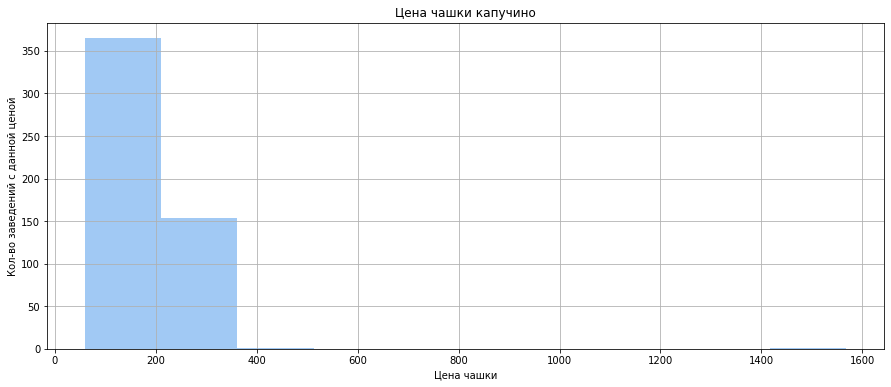

In [71]:
plt.figure(figsize=(15, 6))
data_coffee['middle_coffee_cup'].hist()

plt.xlabel('Цена чашки')
plt.ylabel('Кол-во заведений с данной ценой')
plt.title('Цена чашки капучино')

plt.show()

In [72]:
data_coffee['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

Медианное значение чашки капучино равно 170 рублям,  среднее - 175.  В связи с этим при открытии я бы ориентировалась на 170 рублей.

## Вывод
1) Предобработка данных

В результате предобработки данных было сделано следующее:

  * Выявлено очень много пропущенных данных. Есть пропуски в столбцах с расписанием (hours), категорией цены (price), средней стоимости заказа(avg_bill), числом с оценкой среднего чека(middle_avg_bill), (middle_coffee_cup) и количеством посадочных мест(seats), причём в случае с расписанием это всего лишь 6% данных, в случае с количеством посадочных мест-43%, а в остальных - больше 50%. Цена чашки кофе указана только в 535 строчках - 6% данных. Т.к удалять большую часть данных было бы нерационально, пропуски в расписании я заменила на "неизвестно", остальные оставила, как есть.

  * Полных дубликатов не обнаружено. Однако есть дубликаты в названиях. Большая часть образовалась из-за сетевых заведений, однако имела место ошибка, в результате которой часть названий заменилась на тип заведения (348 "Кафе" и 1 "Ресторан") - эти строчки были удалены. Таким образом, исследуются 8057 заведений.
  * Названия округов заменены на их сокращения для удобства визуализации.
  * Добавлены два столбца: с названиями улиц и с указанием, является ли заведение круглосуточным .
    
2) Анализ данных
- Исследование распределения по типам заведения: больше всего кафе (27%) и ресторанов (25%). Кофейни на третьем месте (17%). Меньше всего столовых и булочных (по 3%)


- Исследование числа посадочных мест: Больше всего в среднем посадочных мест в барах (возможно, за счёт мест у стойки?) - 125. В ресторанах чуть меньше - 122. В кофейнях - 112. Минимальное  среднее число в булочных - 88. 


- Исследование количества сетевых заведений: не-сетевых заведений больше, чем сетевых (86% против 14%, если считать сеть заведений за одно, и 60% против 40% - если считать каждое заведение отдельно). Чаще всего сетевыми бывают булочные:62.1% принажлежат той или иной сети. Далее пиццерии (52.4%) и кофейни (51.5%). Реже всего сетевыми бывают бары (22.2%)


- Исследование топ-15 сетей (оценка проводилась по количеству точек): 
  1. в топ-15 попали в основном относительно недорогие сетевые заведения
  2. Больше всего заведений из топ-15 находится в ЦАО. По количеству лидируют Шоколадница (38 точек), Prime (37 точек) и братья Караваевы (32 точки). Если смотреть распределение по остальным районам, то чаще всего встречается та же Шоколадница. Prime и братья Караваевы же в других районах почти не представлены. Зато много точек у Яндекс-Лавки, Додо-Пицце и Домино'с пицце.
  3. Лидируют кофейни, меньше ресторанов и кафе. Больше всего в центре, как обычно. 
 
 !! В данных явно есть ошибки: не может в топе-15 оказаться бар с 4 точками (когда минимальное количество точек у "Му-му" - 27) и столовая -с двумя. Принято решение не исправлять ошибки вручную из-за недостатка информации о типах заведений.
  
  
- Исследование распределения по районам: Во всех областях больше всего кафе и ресторанов, чуть меньше кофеен. Больше всего заведений каждого типа в центре


- Исследование рейтингов: 
    1. усреднённые рейтинги почти не отличаются друг от друга и равны приблизительно 4.3
    2. Выше всего рейтинг у заведений в центре - хотя различия в рейтинге несущественные, около 0.3 пунктов
    
    
- Исследование топ-15 улиц по кол-ву заведений: Больше всего кафе и ресторанов, почти нет булочных и столовых. "Популярнее" всего Профсоюзная, проспект Мира и проспект Вернадского, меньше всего - на Кутузовском и на улице Миклухо-Маклая.


- Исследование улиц с 1 заведением: большую часть таких "одиночных" заведений составляют кафе, чуть меньше кафе и кофеен. В большей части из них средний счёт меньше 1000, 2/3 из них несетевые. Предположу, что сами улицы при этом недлинные.

- Исследование среднего чека: 
  * Выше всего значение среднего чека в ЦАО и ЗАО (хотя минимум для ЦАО - 0 рублей. Вероятно, это ошибка). Медианное значение -1000 рублей.
  * Ниже всего в ЮВАО. Медианное значение  - 450 рублей.
  * Линейной зависимости от расстояния до центра нет.
  
3) Детализация исследования: открытие кофейни
 * Из предыдущего анализа данных можно сказать, что в городе 1399 кофеен, они составляют 17% от всех заведений. 720 из них сетевых - всего 117 сетей.

* Больше всего их в центре (94 точки), меньше всего в ЮВАО (15 точек) и в СЗАО (20 точек). В ЮЗАО 25 точек, в остальных от 30 до 41.

* В датасете есть 59 кофеен, работающих круглосуточно.

* Усреднённые рейтинги по районам почти не меняются: от 4.2 до 4.3

* Особенности распределения по районам: 
  - В Центре кофейни расположены относительно равномерно. 
  - В Северном округе кофейни также расположены относительно равномерно, но в Дегунино и Западном Дегунино их почти нет
  - В Южном округе количество кофеен убывает при удалении от центра. Хотя в Южном Орехово-Борисово и Центральном Чертаново их несколько больше, чем  близлежащих районах
  - В Восточном округе кофейни по большей части расположены вокруг Измайловского лесопарка.
  - В Западном округе количество кофеен больше ближе к центру, а также вдоль Кутузовского проспекта и в Раменках
  - В Северо-западном округе также количество кофеен больше ближе к центру, а также в Тушино, Щукино и Хорошёво-Мневники
  - В Северо-восточном округе кофейни расположены относительно равномерно, но ближе к окраинам Москвы их число сильно падает.
  - В Юго-западном округе кофейни расположены относительно равномерно, но почти нет вокруг Битцевского парка
  - В Юго-восточном округе больше всего кофеен в Марьино и Текстильщиках, почти нет в Кузьминках

- В ВАО и ЗАО средний чек достаточно большой, и при этом число заведений там не слишком велико => можно считать эти округа оптимальными для открытия новой точки.
- Медианное значение чашки капучино равно 170 рублям,  среднее - 175.  В связи с этим при открытии я бы ориентировалась на 170 рублей.

<hr style="border: 2px solid green;" />

## Общий комментарий
Спасибо за проделанную работу🤝

Арина, проект выполнен хорошо, ты детально изучила предоставленные данные, молодец👌

Не обошлось без доработок:
- проверить формирование признака _круглосуточно_
- сортировка на графиках
- замена одно из графиков

**Презентация**

Презентация выполнена хорошо. Отдельно отмечу детальное исследование географии (слайд 8)👌

На слайде 9, рекомендую убрать _И так,..._

И добавить источник данных: 
Александр Богачев в книге _Графики, которые убеждают всех_ так описывает указание источников:
```
Всегда указывайте источники ваших данных. Без них ценность и доверие к вашему графику резко снижается. Когда читатель не может проверить данные, ему сложно вам поверить.
Если вы сами провели часть расчетов, то вполне можете написать: «Данные Росстата + собственные расчеты автора».
После того, как вы указали источник, отвечайте за данные. Кто-то действительно может пойти и проверить.
```

Исправляй и отправляй на проверку🛠